In [34]:
from collections import defaultdict
import csv
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image, ImageDraw, ImageFont, ImageColor
import xml.etree.ElementTree as ET

GSV_IMAGE_WIDTH  = 13312
GSV_IMAGE_HEIGHT = 6656

In [2]:
%matplotlib inline

In [3]:
# Galen's Desktop
#tohme_file = "/mnt/c/Users/gweld/sidewalk/sidewalk_ml/tohme/mysql_tohme.tsv"
# Galen's laptop
#tohme_file = "/Users/galenweld/project_sidewalk_ml/tohme/mysql_tohme.tsv"
#tohme_file = "/Users/galenweld/project_sidewalk_ml/tohme/tohme_binned.tsv"
tohme_file = "/Users/galenweld/project_sidewalk_ml/tohme/tohme_researcher_kotaro.tsv"
#path_to_scrapes = '/mnt/e/tohme_panos/tohme_data/GSV/'
path_to_scrapes = '/Volumes/Samsung_T5/tohme_panos/tohme_data/GSV/'

In [4]:
# tohme dict fields
# svImageX svImageY originalPitch originalHeading LabelId labelLng LabelBinId LabelTypeId
# heading pitch labelLat originalCanvasX originalCanvasY LabelGSVPanoramaId

class TohmeObject(object):
    def __init__(self):
        self.corners = []
        
        self.LabelId         = None
        self.pano_id         = None
        self.LabelTypeId     = None
        # note: these ogHeading and ogPitch appear to vary across features
        self.originalHeading = None
        self.heading         = None
        #self.originalPitch = None
        #self.labelLat = None
        #self.labelLng = None
        return
    
    def __len__(self):
        return len(self.corners)
    
    def add_corner(self, row):
        err_str = "{} {} for LabelId " + str(self.LabelId)
        
        if self.LabelId is None:
            self.LabelId = int(row["LabelId"])
        else:
            assert self.LabelId == int(row["LabelId"]), err_str.format(self.LabelId, int(row["LabelId"]))
            
        if self.LabelTypeId is None:
            self.LabelTypeId = int(row["LabelTypeId"])
        else:
            assert self.LabelTypeId == int(row["LabelTypeId"]), err_str.format(self.LabelTypeId, int(row["LabelTypeId"]))
        
        if self.pano_id is None:
            self.pano_id = row['LabelGSVPanoramaId']
        else:
            assert self.pano_id == row['LabelGSVPanoramaId'], err_str.format(self.pano_id, row['LabelGSVPanoramaId'])
        
        if self.originalHeading is None:
            self.originalHeading = float(row['originalHeading'])
        else:
            assert self.originalHeading == float(row['originalHeading']), err_str.format(self.originalHeading, row['originalHeading'])
        
        if self.heading is None:
            self.heading = float(row['heading'])
        else:
            assert self.heading == float(row['heading']), err_str.format(self.heading, row['heading'])
            
        sv_x, sv_y = int(row['svImageX']), int(row['svImageY'])
        self.corners.append((sv_x, sv_y))
        
    def show_poly(self, bbox=True):
        ''' show the shape of the polygon.
            bbox toggles showing the square bounding box
        '''
        xs, ys = zip(*self.corners)
        plt.plot(xs+xs[0:1], ys+ys[0:1])
        if bbox:
            bxs, bys = zip(*self.bbox())
            plt.plot(bxs, bys)
        cx, cy = self.center()
        plt.scatter(cx, cy, s=4)
        plt.title("Shape of polygon for label{}".format(self.LabelId))
        if bbox: plt.axis('square')
        plt.show()
        
    def center(self):
        ''' return the centroid '''
        xs, ys = zip(*self.corners)
        
        cx = float(sum(xs))/len(self)
        cy = float(sum(ys))/len(self)
        return cx, cy
        
    def bbox(self):
        ''' return the smallest square containing all poly corners '''
        xs, ys = zip(*self.corners)
        top    = max(ys)
        bottom = min(ys)
        left   = min(xs)
        right  = max(xs)
        
        width = right-left
        height = top-bottom
        
        
        if width > height:
            padding = (width-height)/2
            bottom -= padding
            top += padding
            
        else:
            padding = (height-width)/2
            left -= padding
            top += padding
        
        return ((left, top),(right,top),(right,bottom),(left,bottom),(left,top))
    
    def __hash__(self):
        return int.__hash__(self.LabelId)
    
    def __contains__(self, other):
        if self.pano_id != other.pano_id:
            return False
        
        contains = True
        for corner in other.corners:
            if corner not in self.corners:
                contains = False
                
        return contains

In [5]:
def get_tohme_img(pano_id):
    imgpath = os.path.join(path_to_scrapes, pano_id, "images", 'pano.jpg')
    return Image.open(imgpath, 'r')

In [6]:
def get_tohme_meta(pano_id):
    metapath = os.path.join(path_to_scrapes, pano_id, "meta.xml")
    root =  ET.parse(metapath).getroot()

    d = dict()
    
    dp = root.find('data_properties')
    for key in ('lat', 'lng'):
        d[key] = float(dp.attrib[key])
    for c in dp:
        if c.tag == 'copyright': continue
        d[c.tag] = c.text
    pp = root.find('projection_properties')
    for key in ('pano_yaw_deg','tilt_pitch_deg', 'tilt_yaw_deg'):
        d[key] = float(pp.attrib[key])
    return d

In [7]:
features = defaultdict(TohmeObject)
panos = set()

with open(tohme_file) as f:
    reader = csv.DictReader(f, delimiter='\t')
    for row in reader:
        LabelId = int(row['LabelId'])
        features[LabelId].add_corner(row)
        
        pano = row['LabelGSVPanoramaId']
        panos.add(pano)
        
print "created {} features".format(len(features))
num_panos = len(panos)
print "found {} unique panos".format(num_panos)
label_types = set([f.LabelTypeId for f in features.values()])
print "found {} different labels:{}".format(len(label_types), label_types)

created 5123 features
found 874 unique panos
found 2 different labels:set([1, 2])


In [8]:
for feat in features.values():
    if feat.originalHeading != feat.heading:
        print feat.LabelId
        
# if this doesn't print anything, then all the headings are the same

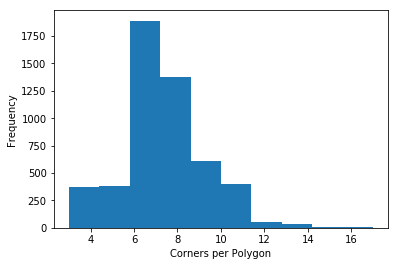

In [9]:
plt.hist([len(f) for f in features.values()])
plt.xlabel("Corners per Polygon")
plt.ylabel("Frequency")
plt.show()

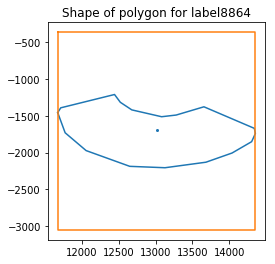

In [10]:
biggest_feat = max(features.values(), key=len)
biggest_feat.show_poly()

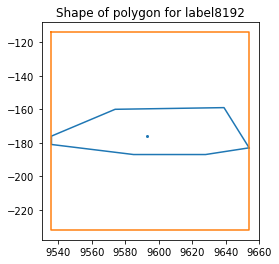

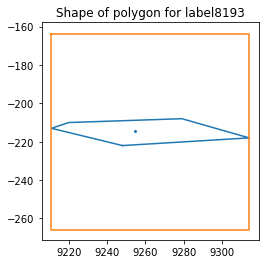

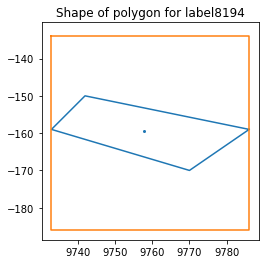

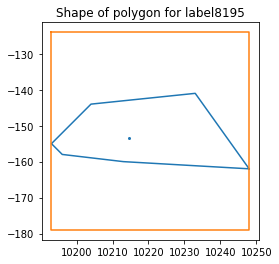

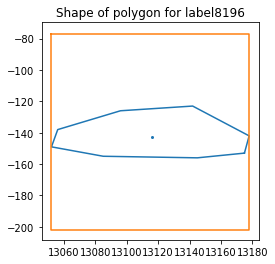

In [11]:
for feat in features.values()[:5]:
    feat.show_poly()

In [12]:
panos = defaultdict(list)
for feat in features.values():
    panos[feat.pano_id].append(feat)
print "got features for {} panos.".format(len(panos))

got features for 874 panos.


In [13]:
len(panos)

874

In [14]:
biggest_pano, feats_in_biggest_pano = max(panos.items(), key=lambda x: len(x[1]))
print "biggest pano {} has {} feats".format(biggest_pano, len(feats_in_biggest_pano))

biggest pano VXbualqXhqMO-2wv1QaV4A has 33 feats


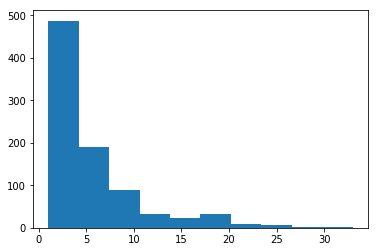

In [15]:
plt.hist([len(p) for p in panos.values()])
plt.show()

In [16]:
len(feats_in_biggest_pano)

33

In [17]:
counter = defaultdict(int)
for f in features.values():
    counter[f.LabelTypeId] += 1
print counter

defaultdict(<type 'int'>, {1: 4341, 2: 782})


In [18]:
dupes = 0
corners = set()
for feat in feats_in_biggest_pano:
    for corner in feat.corners:
        if str(corner) in corners: dupes += 1
        else: corners.add(str(corner))
print dupes

172


In [19]:
len(corners)

94

In [20]:
regions = defaultdict(set)
for p in panos.keys():
    try:
        regions[get_tohme_meta(p)['region']].add( p )
    except:
        print "skipping {} due to missing XML".format(p)

print "{:<35}{}".format("Region", "Count")
for region, panos_in_region in regions.items():
    print "{:<35}{}".format(region, len(panos_in_region))

skipping Nd0m6cjkXqqugsP9AOHkdQ due to missing XML
Region                             Count
Baltimore, Maryland                214
Pikesville, Maryland               22
Compton                            132
Los Angeles                        112
Washington, District of Columbia   227
Maryland                           1
Saskatoon, Saskatchewan            165


In [21]:
compton_panos = list(regions['Compton'])

In [22]:
get_tohme_meta(compton_panos[0])

{'country': 'United States',
 'lat': 33.89842,
 'lng': -118.231971,
 'pano_yaw_deg': 268.82,
 'region': 'Compton',
 'text': 'North Aranbe Avenue / West Palmer Street',
 'tilt_pitch_deg': 1.35,
 'tilt_yaw_deg': -109.14}

In [23]:
def show_pano(pano_id, shift=0):
    label_to_color = {1:'b', 2:'g', 3:'r', 4:'y'}
    
    img_array = np.asarray(get_tohme_img(pano_id))
    meta = get_tohme_meta(pano_id)
    pano_yaw_degree = meta["pano_yaw_deg"] + shift
    #pano_yaw_degree = meta["tilt_yaw_deg"] + shift
    
    feats = panos[pano_id]
    xs, ys, cs = [], [], []
    for f in feats:
        for sv_image_x, sv_image_y in f.corners:
            #x = sv_image_x
            x = ((float(pano_yaw_degree) / 360) * 13312 + sv_image_x) % 13312
            #x = ((f.heading / 360) * 13312 + sv_image_x) % 13312
            y = 6656 / 2 - sv_image_y

            xs.append(x)
            ys.append(y)
            
            cs.append(label_to_color[f.LabelTypeId])
    
    location = meta['text'] + "\n" + meta['region']
    plt.figure(figsize=(30,15))
    plt.scatter(xs, ys, c=cs)
    plt.imshow(img_array)
    plt.xlim=13312
    plt.ylim=6656
    plt.title(location)
    plt.show()

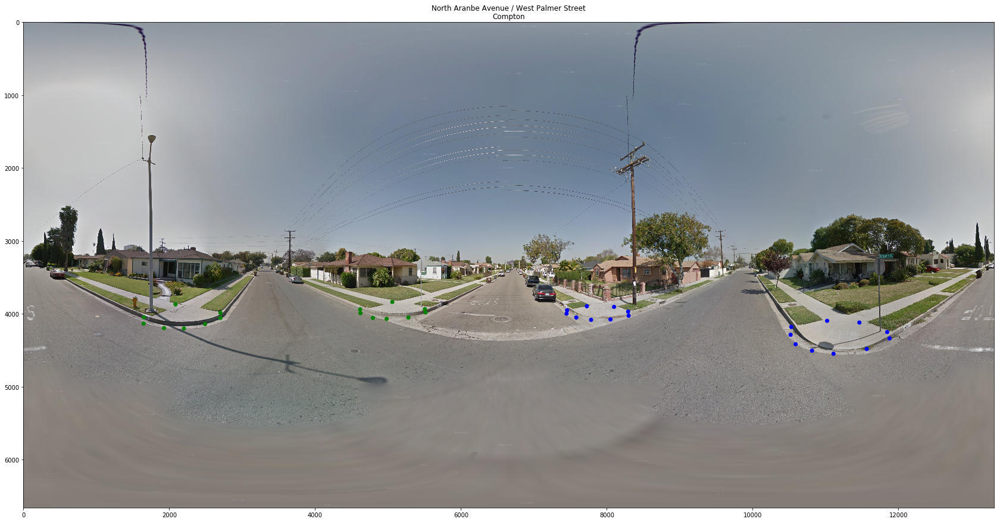

In [24]:
show_pano(compton_panos[0])

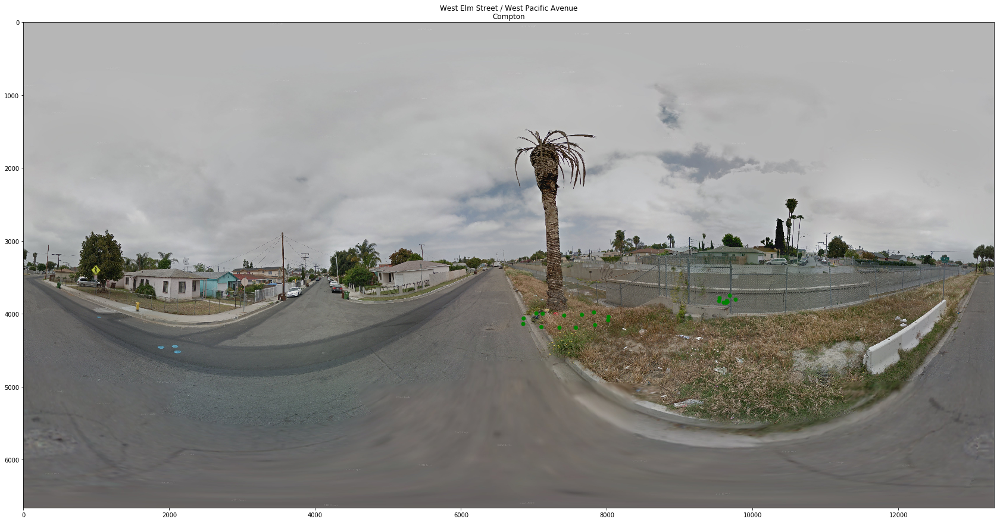

In [25]:
show_pano(compton_panos[1])

{'text': 'North Aranbe Avenue / South Aranbe Avenue / West Elm Street', 'region': 'Compton', 'tilt_pitch_deg': 1.7, 'tilt_yaw_deg': -108.87, 'pano_yaw_deg': 358.77, 'lat': 33.900655, 'lng': -118.232115, 'country': 'United States'}


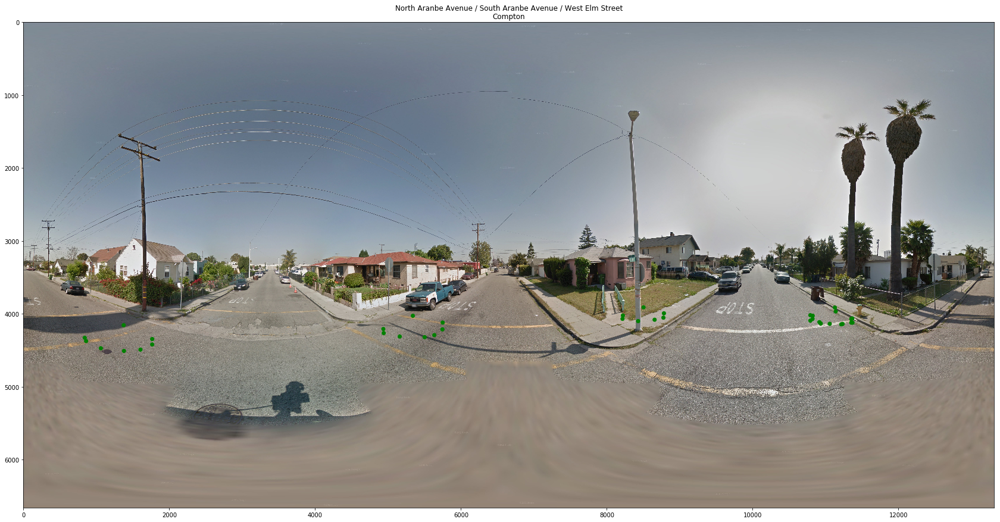

In [61]:
print get_tohme_meta(compton_panos[2])
show_pano(compton_panos[2])

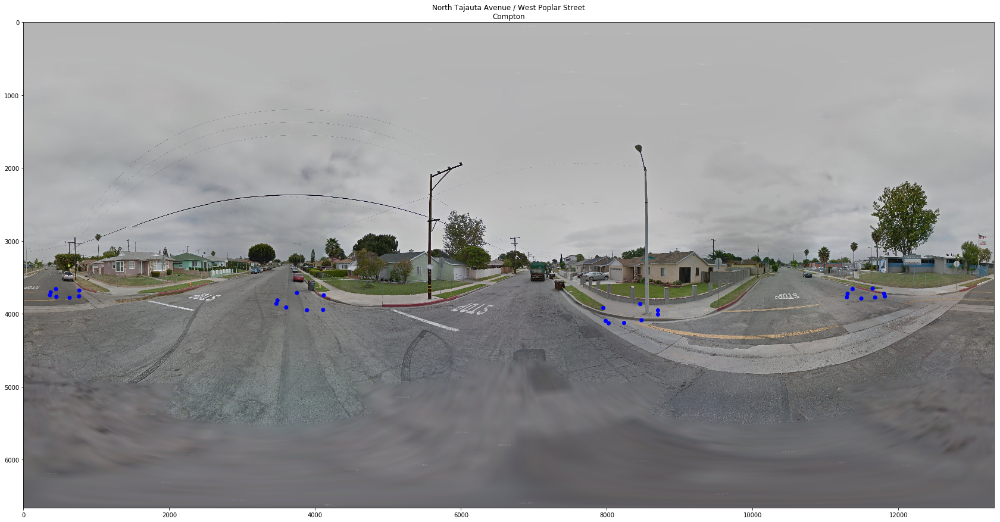

In [27]:
show_pano(compton_panos[3])

In [58]:
def write_feats_to_pano(pano_id):
    label_to_color = {1:ImageColor.getrgb('Navy'), 2:ImageColor.getrgb('red')}
    r = 10
    
    img = get_tohme_img(pano_id)
    draw = ImageDraw.Draw(img)
    
    meta = get_tohme_meta(pano_id)
    pano_yaw_deg = meta["pano_yaw_deg"]
    
    feats = panos[pano_id]
    for f in feats:
        color = label_to_color[f.LabelTypeId]
        for sv_x, sv_y in f.corners:
            x = ((float(pano_yaw_deg) / 360) * GSV_IMAGE_WIDTH + sv_x) % GSV_IMAGE_WIDTH
            y = GSV_IMAGE_HEIGHT / 2 - sv_y

            draw.ellipse((x - r, y - r, x + r, y + r), fill=color)
    
    location = meta['text'] + "\n" + meta['region']
    
    with open("/Users/galenweld/Desktop/{}.jpeg".format(pano_id), 'w') as f:
        img.save(f)

    return img

In [60]:
for pano_id in compton_panos[:5]:
    write_feats_to_pano(pano_id)

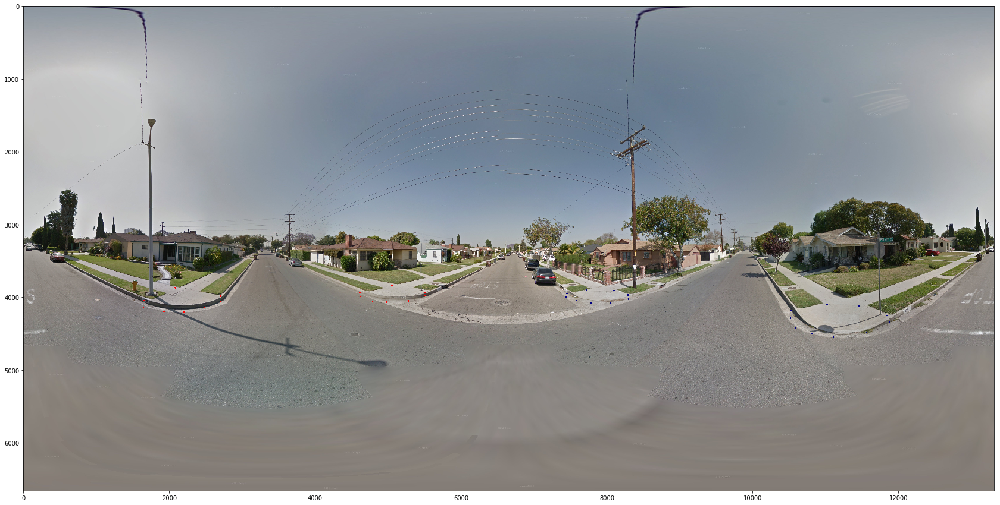

In [47]:
plt.figure(figsize=(30,15))
plt.imshow(np.asarray(img))
plt.show()
    